In [1]:
import sys
sys.path.append("/home/jarlehti/projects/gradu")

In [29]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import linalg
import glob
from pprint import pprint
from scripts.constants import COLUMNS_FOR_DATASET

In [9]:
CURRENT_FOLDER = os.path.dirname(os.path.dirname(os.path.abspath(__name__)))
BU_FOLDER2 = os.path.join(os.path.dirname(CURRENT_FOLDER), "cluster_backup", "gradu_cluster_backup_16042023")

In [12]:
ci_coverage_files = glob.glob(os.path.join(BU_FOLDER2, "results", 'ci_coverage_napsu_original_model_*.csv'))

In [19]:
pprint(ci_coverage_files)

['/home/local/jarlehti/projects/cluster_backup/gradu_cluster_backup_16042023/results/ci_coverage_napsu_original_model_binary4d_30e_A+D-B+D-C+D.csv',
 '/home/local/jarlehti/projects/cluster_backup/gradu_cluster_backup_16042023/results/ci_coverage_napsu_original_model_binary4d_01e_A+D-B+D.csv',
 '/home/local/jarlehti/projects/cluster_backup/gradu_cluster_backup_16042023/results/ci_coverage_napsu_original_model_binary3d_01e_A+C.csv',
 '/home/local/jarlehti/projects/cluster_backup/gradu_cluster_backup_16042023/results/ci_coverage_napsu_original_model_binary4d_80e_B+D-C+D.csv',
 '/home/local/jarlehti/projects/cluster_backup/gradu_cluster_backup_16042023/results/ci_coverage_napsu_original_model_binary3d_03e_empty.csv',
 '/home/local/jarlehti/projects/cluster_backup/gradu_cluster_backup_16042023/results/ci_coverage_napsu_original_model_adult_small_03e_age+compensation.csv',
 '/home/local/jarlehti/projects/cluster_backup/gradu_cluster_backup_16042023/results/ci_coverage_napsu_original_model_bi

In [28]:
df = pd.read_csv(ci_coverage_files[0])
df

,original_dataset_name,index,n_datasets,conf_int_range,conf_int_start,conf_int_end,conf_int_width,true_parameter_value,contains_true_parameter,query_str,experiment_id,epsilon
0,binary4d,0,100,0.05,0.936157,0.937491,0.001334,1.016868,False,A+D-B+D-C+D,1NX1SNJL,3.0
1,binary4d,0,100,0.05,0.055649,0.057382,0.001733,-0.004847,False,A+D-B+D-C+D,1NX1SNJL,3.0
2,binary4d,0,100,0.05,1.962398,1.964383,0.001986,1.997028,False,A+D-B+D-C+D,1NX1SNJL,3.0
3,binary4d,0,100,0.10,0.935467,0.938788,0.003321,1.016868,False,A+D-B+D-C+D,1NX1SNJL,3.0
4,binary4d,0,100,0.10,0.051635,0.054647,0.003013,-0.004847,False,A+D-B+D-C+D,1NX1SNJL,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2845,binary4d,49,100,0.90,0.037133,0.070352,0.033220,-0.004847,False,A+D-B+D-C+D,1NX1SNJL,3.0
2846,binary4d,49,100,0.90,1.934591,1.992709,0.058118,1.997028,False,A+D-B+D-C+D,1NX1SNJL,3.0
2847,binary4d,49,100,0.95,0.910146,0.962736,0.052590,1.016868,False,A+D-B+D-C+D,1NX1SNJL,3.0
2848,binary4d,49,100,0.95,0.031953,0.076871,0.044918,-0.004847,False,A+D-B+D-C+D,1NX1SNJL,3.0


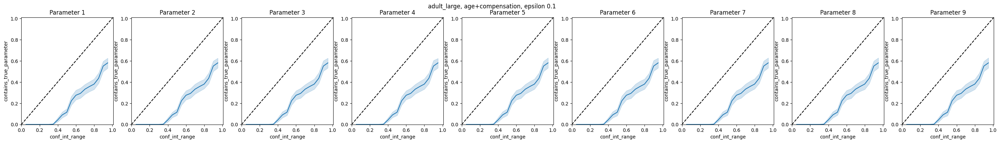

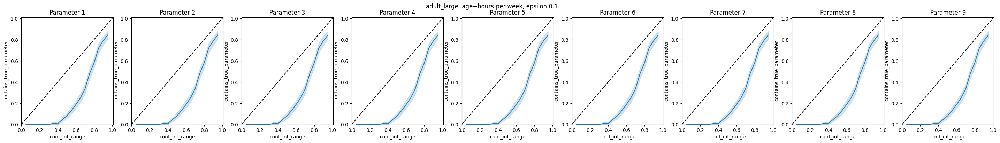

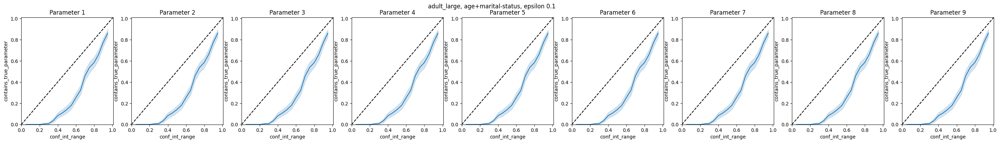

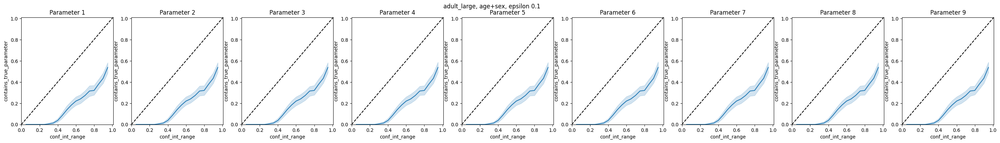

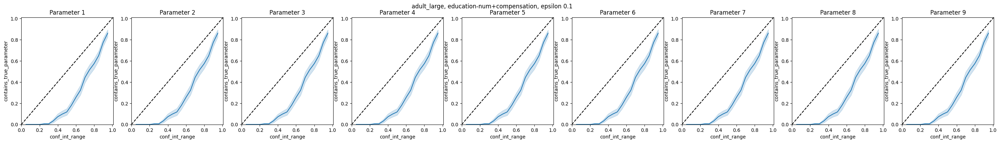

...

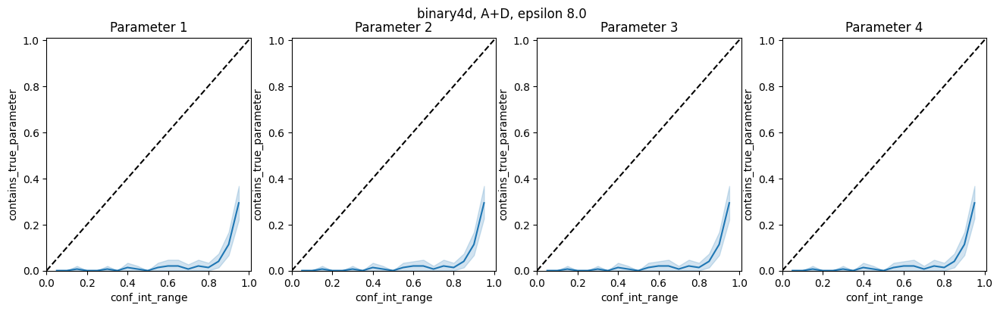

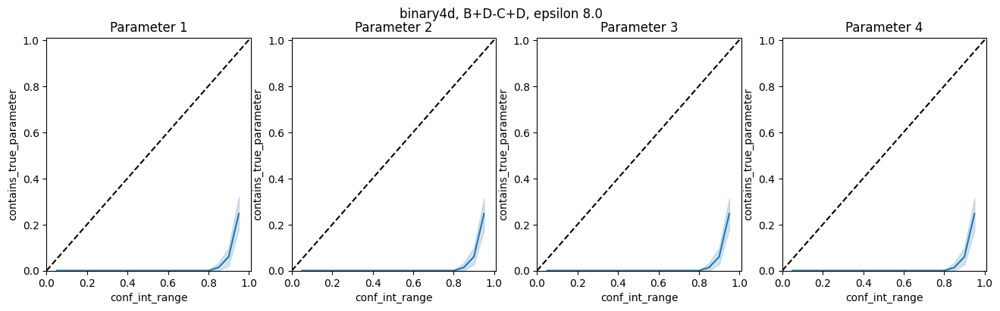

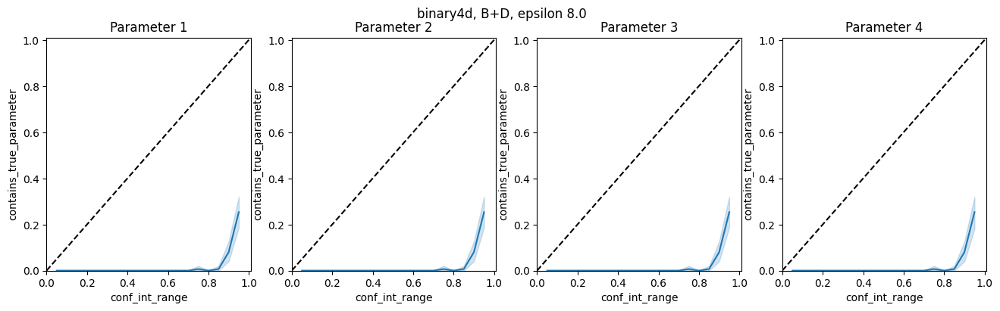

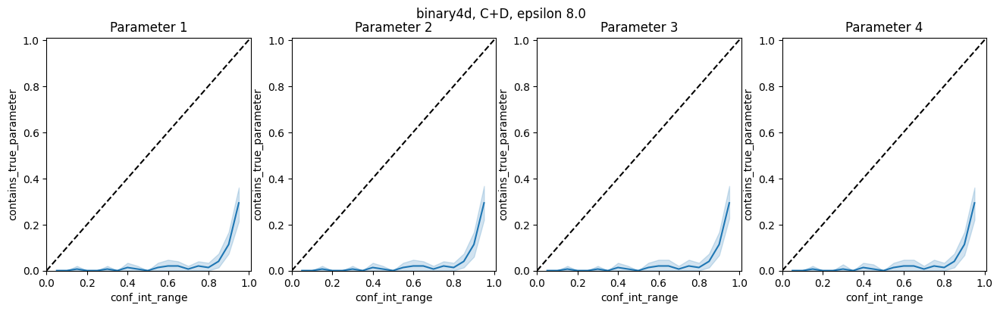

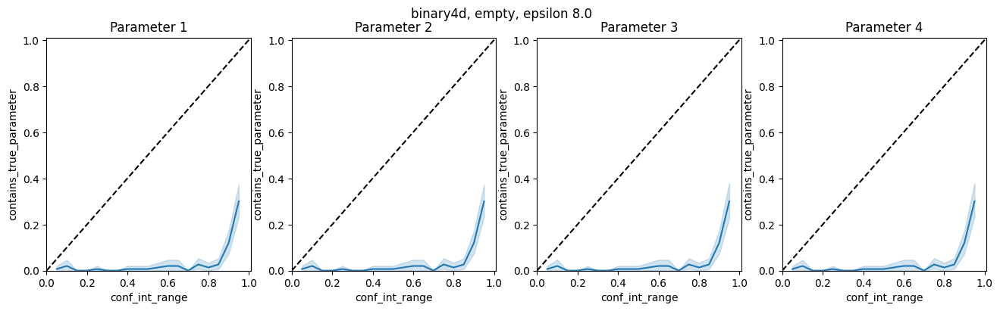

In [50]:
for file in sorted(ci_coverage_files):
    df = pd.read_csv(file)
    original_datset_name = df['original_dataset_name'][0] 
    query_str = df['query_str'][0]
    epsilon = df['epsilon'][0]
    
    dims = len(COLUMNS_FOR_DATASET[original_datset_name])
    
    fig, axes = plt.subplots(1, dims, figsize=(dims*4, 4))

    for i in range(dims):
        ax = axes[i]
        g = sns.lineplot(x="conf_int_range", y="contains_true_parameter", markers=True, err_style="band", data=df, ax=ax)
        diag = (0.0, 1.01)
        ax.plot(diag, diag, linestyle="dashed", color="black")
        ax.set_xlim(diag)
        ax.set_ylim(diag)
        ax.set_title(f"Parameter {i+1}")
    
    fig.suptitle(f"{original_datset_name}, {query_str}, epsilon {epsilon}")
    plt.show()